## Credits
    https://medium.com/towards-data-science/mastering-customer-segmentation-with-llm-3d9008235f41

## 3 ways of CX segmentation we do here
    - K means
    - K-Prototype
    - LLM + K means

![Screenshot 2023-10-10 at 14.46.57.png](<attachment:Screenshot 2023-10-10 at 14.46.57.png>)
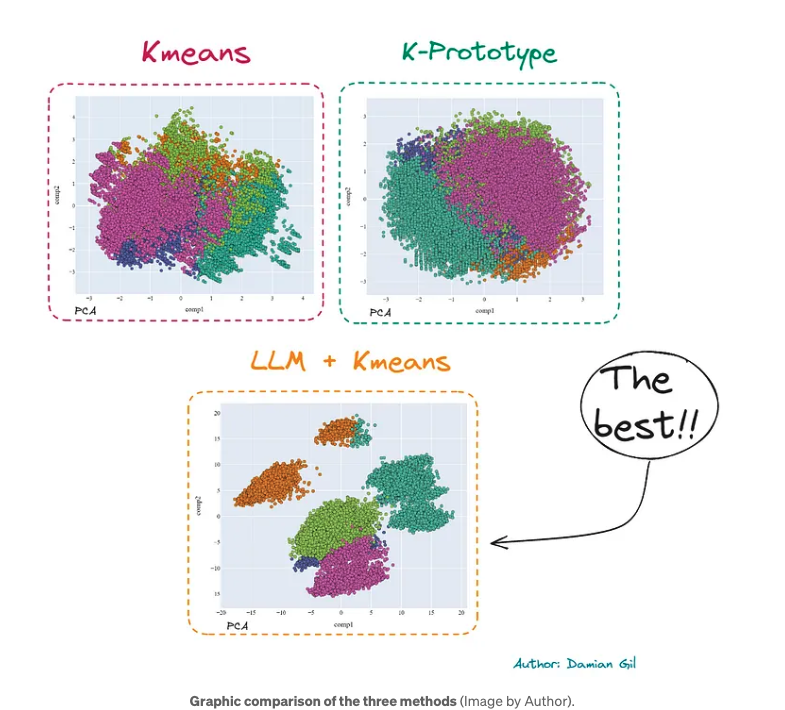

## Dataset
    https://www.kaggle.com/datasets/prakharrathi25/banking-dataset-marketing-targets

In [1]:
import numpy as np 
import pandas as pd

In [2]:
def load_data(data_path):
    df = pd.read_csv(
                    data_path,
                    sep=';'
                    )
    df = df[[
            'age',
            'job',
            'marital',
            'education',
            'default',
            'housing',
            'loan',
            'balance'
    ]] # only use first 8 columns
    return df

In [3]:
load_data('datasets/Banking-Marketing Targets/train.csv')

,age,job,marital,education,default,housing,loan,balance
0,58,management,married,tertiary,no,yes,no,2143
1,44,technician,single,secondary,no,yes,no,29
2,33,entrepreneur,married,secondary,no,yes,yes,2
3,47,blue-collar,married,unknown,no,yes,no,1506
4,33,unknown,single,unknown,no,no,no,1
...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,no,no,825
45207,71,retired,divorced,primary,no,no,no,1729
45208,72,retired,married,secondary,no,no,no,5715
45209,57,blue-collar,married,secondary,no,no,no,668


# Method 1 : K-means

In [4]:
# !pip install plotly shap pyod yellowbrick prince lightgbm

In [5]:
import shap
import seaborn as sns
import matplotlib.cm as cm
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder, OneHotEncoder
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import prince
import lightgbm as lgb

In [6]:
df_train = load_data('datasets/Banking-Marketing Targets/train.csv')
df_test = load_data('datasets/Banking-Marketing Targets/test.csv')

### Nominal vs Ordinal Categorical Variables
    Nominal: Used to categorize data into mutually exclusive categories or groups.
    Ordinal: Used to measure variables in a natural order, such as rating or ranking. They 

In [7]:
categorical_transformer_onehot = Pipeline(
                                        steps=[
                                                (
                                                "encoder", 
                                                OneHotEncoder(
                                                                handle_unknown="ignore", 
                                                                drop="first", 
                                                                sparse=False
                                                                ))
                                            ])

categorical_transformer_ordinal = Pipeline(
                                        steps=[
                                                (
                                                "encoder", 
                                                OrdinalEncoder()
                                                )
                                            ])

numeric_transformer = Pipeline(
                                steps=[
                                        (
                                        "encoder", 
                                        PowerTransformer()
                                        )
                                ])


preprocessor  = ColumnTransformer(transformers = [
                                                ('cat_onehot', categorical_transformer_onehot, ["default", "housing", "loan", "job", "marital"]),
                                                ('cat_ordinal', categorical_transformer_ordinal, ["education"]),
                                                ('num', numeric_transformer, ["age", "balance"])
                                                ])

In [8]:
pipeline = Pipeline(
                    steps=[("preprocessor", preprocessor)]
                    )
pipe_fit = pipeline.fit(df_train)

df_train_kmeans = pd.DataFrame(
                                pipe_fit.transform(df_train), 
                                columns = pipe_fit.get_feature_names_out().tolist()
                                )

df_test_kmeans = pd.DataFrame(
                                pipe_fit.transform(df_test), 
                                columns = pipe_fit.get_feature_names_out().tolist()
                                )

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


In [9]:
df_train_kmeans.columns.tolist()

['cat_onehot__default_yes',
 'cat_onehot__housing_yes',
 'cat_onehot__loan_yes',
 'cat_onehot__job_blue-collar',
 'cat_onehot__job_entrepreneur',
 'cat_onehot__job_housemaid',
 'cat_onehot__job_management',
 'cat_onehot__job_retired',
 'cat_onehot__job_self-employed',
 'cat_onehot__job_services',
 'cat_onehot__job_student',
 'cat_onehot__job_technician',
 'cat_onehot__job_unemployed',
 'cat_onehot__job_unknown',
 'cat_onehot__marital_married',
 'cat_onehot__marital_single',
 'cat_ordinal__education',
 'num__age',
 'num__balance']

### Outlier / Anomaly detection

In [10]:
outlier_detector = ECOD()
outlier_detector.fit(df_train_kmeans)

outliers_train = outlier_detector.predict(df_train_kmeans)
outliers_test = outlier_detector.predict(df_test_kmeans)

df_train_kmeans["outlier"] = outliers_train
df_test_kmeans["outlier"] = outliers_test

In [11]:
df_train_kmeans

,cat_onehot__default_yes,cat_onehot__housing_yes,cat_onehot__loan_yes,cat_onehot__job_blue-collar,cat_onehot__job_entrepreneur,cat_onehot__job_housemaid,cat_onehot__job_management,cat_onehot__job_retired,cat_onehot__job_self-employed,cat_onehot__job_services,cat_onehot__job_student,cat_onehot__job_technician,cat_onehot__job_unemployed,cat_onehot__job_unknown,cat_onehot__marital_married,cat_onehot__marital_single,cat_ordinal__education,num__age,num__balance,outlier
0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,1.473637,0.414773,0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.429379,-0.410774,0
2,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,-0.709873,-0.431122,0
3,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,0.683128,0.197685,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0,-0.709873,-0.432119,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.993503,-0.052398,0
45207,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.207438,0.275122,1
45208,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2.257237,1.495765,1
45209,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.409327,-0.114235,0


In [12]:
# Data without outliers
df_train_kmeans_no_outliers = df_train_kmeans[df_train_kmeans["outlier"] == 0]
df_train_kmeans_no_outliers = df_train_kmeans_no_outliers.drop(["outlier"], axis = 1)

df_test_kmeans_no_outliers = df_test_kmeans[df_test_kmeans["outlier"] == 0]
df_test_kmeans_no_outliers = df_test_kmeans_no_outliers.drop(["outlier"], axis = 1)

# Data with Outliers
df_train_kmeans_with_outliers = df_train_kmeans.copy()
df_train_kmeans_with_outliers = df_train_kmeans_with_outliers.drop(["outlier"], axis = 1)

df_test_kmeans_with_outliers = df_test_kmeans.copy()
df_test_kmeans_with_outliers = df_test_kmeans_with_outliers.drop(["outlier"], axis = 1)

### modeling

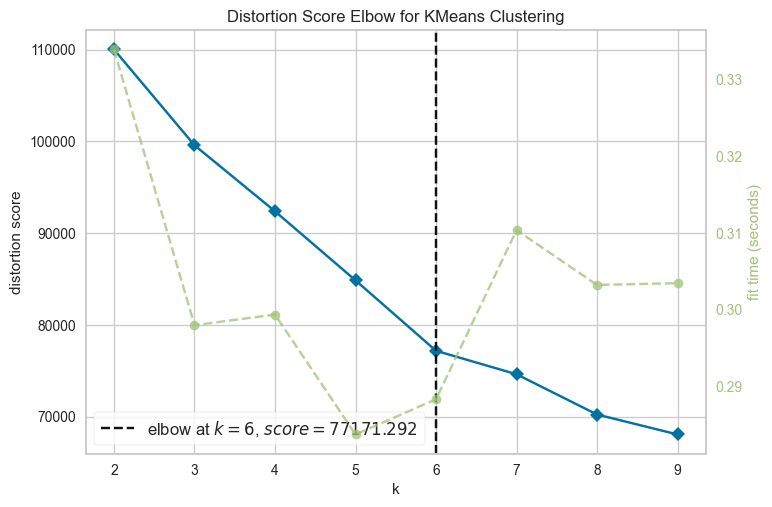

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [13]:
km = KMeans(
            init="k-means++", 
            random_state=0, 
            n_init="auto"
            )
visualizer = KElbowVisualizer(km, k=(2,10))
 
visualizer.fit(df_train_kmeans_no_outliers)        # Fit the data to the visualizer
visualizer.show()    

### Silhoutte Visualization to verify elbow method

In [14]:
def make_Silhouette_plot(X, n_clusters):
    plt.xlim([-0.1, 1])
    plt.ylim([0, len(X) + (n_clusters + 1) * 10])
    clusterer = KMeans(
                        n_clusters=n_clusters, 
                        max_iter = 1000, 
                        n_init = 10, 
                        init = 'k-means++', 
                        random_state=10
                        )
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =", n_clusters,
        "The average silhouette_score is :", silhouette_avg,
    )

    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        plt.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10
        plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
        plt.xlabel("The silhouette coefficient values", fontsize=24)
        plt.ylabel("Cluster label", fontsize=24)
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
        plt.yticks([])  
        plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    
range_n_clusters = list(range(2,10))

for n_clusters in range_n_clusters:
    print(f"N cluster: {n_clusters}")
    make_Silhouette_plot(df_train_kmeans_no_outliers, n_clusters)   
    plt.savefig('visualizations/cx_segmentaion/Silhouette_plot_{}.png'.format(n_clusters))
    plt.close()

N cluster: 2
For n_clusters = 2 The average silhouette_score is : 0.18111287366156348
N cluster: 3
For n_clusters = 3 The average silhouette_score is : 0.167875431080351
N cluster: 4
For n_clusters = 4 The average silhouette_score is : 0.1583411958880807
N cluster: 5
For n_clusters = 5 The average silhouette_score is : 0.16729872600526347
N cluster: 6
For n_clusters = 6 The average silhouette_score is : 0.15485098506259667
N cluster: 7
For n_clusters = 7 The average silhouette_score is : 0.1495307642182215
N cluster: 8
For n_clusters = 8 The average silhouette_score is : 0.15098396457077945
N cluster: 9
For n_clusters = 9 The average silhouette_score is : 0.14842917303539022


#### K = 5,6 both okay. let's go with 5

In [15]:
km = KMeans(
            n_clusters=5,
            init='k-means++', 
            n_init=10,
            max_iter=100, 
            random_state=42
            )

train_clusters_predict = km.fit_predict(df_train_kmeans_no_outliers)
test_clusters_predict = km.predict(df_test_kmeans_no_outliers)

### Evaluation

In [16]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

In [17]:
"""
The Davies Bouldin index is defined as the average similarity measure 
of each cluster with its most similar cluster, where similarity 
is the ratio of within-cluster distances to between-cluster distances.

The minimum value of the DB Index is 0, whereas a smaller 
value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Train Davies bouldin score: {davies_bouldin_score(df_train_kmeans_no_outliers,train_clusters_predict)}")
print(f"Test Davies bouldin score: {davies_bouldin_score(df_test_kmeans_no_outliers,test_clusters_predict)}\n")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.

Calinski Harabaz Index is defined as the ratio of the 
sum of between-cluster dispersion and of within-cluster dispersion.

The higher the index the more separable the clusters.
"""
print(f"Train Calinski Score: {calinski_harabasz_score(df_train_kmeans_no_outliers,train_clusters_predict)}")
print(f"Test Calinski Score: {calinski_harabasz_score(df_test_kmeans_no_outliers,test_clusters_predict)}\n")

"""
The silhouette score is a metric used to calculate the goodness of 
fit of a clustering algorithm, but can also be used as 
a method for determining an optimal value of k (see here for more).

Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either
the data or the value of k is incorrect.

1 is the ideal value and indicates that clusters are very 
dense and nicely separated.
"""
print(f"Train Silhouette Score: {silhouette_score(df_train_kmeans_no_outliers,train_clusters_predict)}")
print(f"Test Silhouette Score: {silhouette_score(df_test_kmeans_no_outliers,test_clusters_predict)}\n")

Train Davies bouldin score: 1.676769775662788
Test Davies bouldin score: 1.6627713114497589

Train Calinski Score: 6914.705500337112
Test Calinski Score: 694.752291840148

Train Silhouette Score: 0.16729335453306268
Test Silhouette Score: 0.16812452558215135



#### results are not promising at all

### Now we going to plot the clusters

In [18]:
def get_pca_2d(df, predict):
    
    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d

def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(
          df, 
          x='comp1', 
          y='comp2', 
          z='comp3',
          color='cluster',
          template="plotly",
          
          # symbol = "cluster",
          
          color_discrete_sequence=px.colors.qualitative.Vivid,
          title=title).update_traces(
              # mode = 'markers',
              marker={
                  "size": 4,
                  "opacity": opacity,
                  # "symbol" : "diamond",
                  "line": {
                      "width": width_line,
                      "color": "black",
                  }
              }
          ).update_layout(
                  width = 800, 
                  height = 800, 
                  autosize = True, 
                  showlegend = True,
                  legend=dict(title_font_family="Times New Roman",
                              font=dict(size= 20)),
                  scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                              yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                              zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                  font = dict(family = "Gilroy", color  = 'black', size = 15))
        
    
    fig.show()

In [19]:
pca_3d_object, df_pca_3d = get_pca_3d(df_train_kmeans_no_outliers, train_clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              2.245        11.81%                     11.81%
1              1.774         9.34%                     21.15%
2              1.298         6.83%                     27.98%


It can be seen that the clusters have almost no separation between them and there is no clear division. This is in accordance with the information provided by the metrics. When we apply the PCA method, since it is a **linear algorithm** , it is not capable of capturing more complex relationships. Luckily there is a method called t-SNE, which is capable of capturing these complex polynomial relationships. This can help us visualize, since with the previous method we have not had much success.

In [20]:
sampling_data = df_train_kmeans_no_outliers.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(train_clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "TSNE Space", opacity=1, width_line = 0.1)

Finally, let’s explore a little how the model works, in which features are the most important and what are the main characteristics of the clusters.
To see the importance of each of the variables we will use a typical “trick” in this type of situation. We are going to create a classification model where the “X” is the inputs of the Kmeans model, and the “y” is the clusters predicted by the Kmeans model.

In [21]:
clf_km = lgb.LGBMClassifier(colsample_by_tree=0.8)
clf_km.fit(X=df_train_kmeans_no_outliers, y=train_clusters_predict)

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002803 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 349
[LightGBM] [Info] Number of data points in the train set: 40690, number of used features: 19
[LightGBM] [Info] Start training from score -1.623919
[LightGBM] [Info] Start training from score -1.413347
[LightGBM] [Info] Start training from score -1.489718
[LightGBM] [Info] Start training from score -2.816857
[LightGBM] [Info] Start training from score -1.293467


LGBMClassifier(colsample_by_tree=0.8)

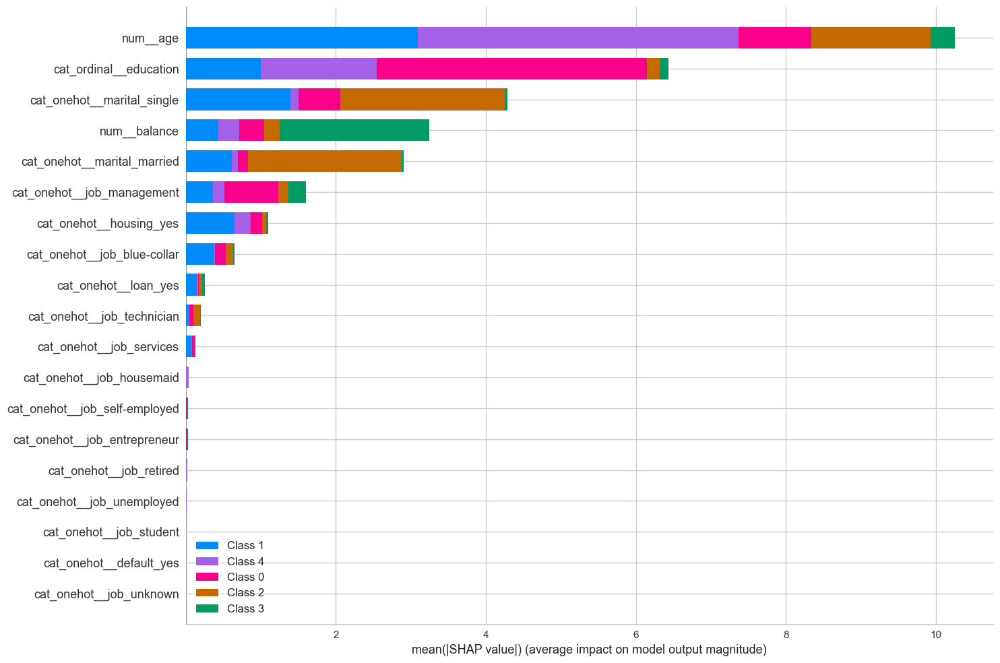

In [24]:
#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(df_train_kmeans_no_outliers)
shap.summary_plot(shap_values_km, df_train_kmeans_no_outliers, plot_type="bar", plot_size=(15, 10))

In [25]:
df_train_kmeans_no_outliers

,cat_onehot__default_yes,cat_onehot__housing_yes,cat_onehot__loan_yes,cat_onehot__job_blue-collar,cat_onehot__job_entrepreneur,cat_onehot__job_housemaid,cat_onehot__job_management,cat_onehot__job_retired,cat_onehot__job_self-employed,cat_onehot__job_services,cat_onehot__job_student,cat_onehot__job_technician,cat_onehot__job_unemployed,cat_onehot__job_unknown,cat_onehot__marital_married,cat_onehot__marital_single,cat_ordinal__education,num__age,num__balance
0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,1.473637,0.414773
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.429379,-0.410774
2,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,-0.709873,-0.431122
3,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,0.683128,0.197685
5,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,-0.472563,-0.302591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45202,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,-0.589198,-0.159379
45205,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,-1.859071,-0.181020
45206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.993503,-0.052398
45209,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.409327,-0.114235


# Method 2: K-Prototype

Kmeans algorithm provided by Skelearn does not accept categorical variables. So we have to encode them. However there is an algorithm that accepts categorical variables for clustering. This algorithm is called **K-Prototype**. 

In [28]:
df_train

,age,job,marital,education,default,housing,loan,balance
0,58,management,married,tertiary,no,yes,no,2143
1,44,technician,single,secondary,no,yes,no,29
2,33,entrepreneur,married,secondary,no,yes,yes,2
3,47,blue-collar,married,unknown,no,yes,no,1506
4,33,unknown,single,unknown,no,no,no,1
...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,no,no,825
45207,71,retired,divorced,primary,no,no,no,1729
45208,72,retired,married,secondary,no,no,no,5715
45209,57,blue-collar,married,secondary,no,no,no,668


In [37]:
pipe = Pipeline([('scaler', PowerTransformer())])
df_train_kp_no_outliers = df_train[df_train_kmeans['outlier'] == 0]
pipe_fit = pipe.fit(df_train_kp_no_outliers[["age", "balance"]])

df_aux = pd.DataFrame(pipe_fit.transform(df_train_kp_no_outliers[["age", "balance"]] ), columns = ["age", "balance"])
df_train_kp_no_outliers = df_train_kp_no_outliers.drop(["age", "balance"], axis = 1)
df_train_kp_no_outliers["age"] = df_aux["age"].values
df_train_kp_no_outliers["balance"] = df_aux["balance"].values
df_train_kp_no_outliers

,job,marital,education,default,housing,loan,age,balance
0,management,married,tertiary,no,yes,no,1.638842,0.614693
1,technician,single,secondary,no,yes,no,0.483486,-0.518179
2,entrepreneur,married,secondary,no,yes,yes,-0.776686,-0.548574
3,blue-collar,married,unknown,no,yes,no,0.764207,0.322509
5,management,married,tertiary,no,yes,no,-0.514212,-0.363644
...,...,...,...,...,...,...,...,...
45202,admin.,single,secondary,no,no,no,-0.643216,-0.164381
45205,technician,single,secondary,no,no,yes,-2.047573,-0.194276
45206,technician,married,tertiary,no,no,no,1.107595,-0.017392
45209,blue-collar,married,secondary,no,no,no,1.567683,-0.102204


In [39]:
# !pip install plotnine kmodes

Cluster initiation: 2
Cluster initiation: 3
Cluster initiation: 4
Cluster initiation: 5
Cluster initiation: 6
Cluster initiation: 7
Cluster initiation: 8
Cluster initiation: 9
Cluster initiation: 10
Cluster initiation: 11
Cluster initiation: 12
Cluster initiation: 13
Cluster initiation: 14


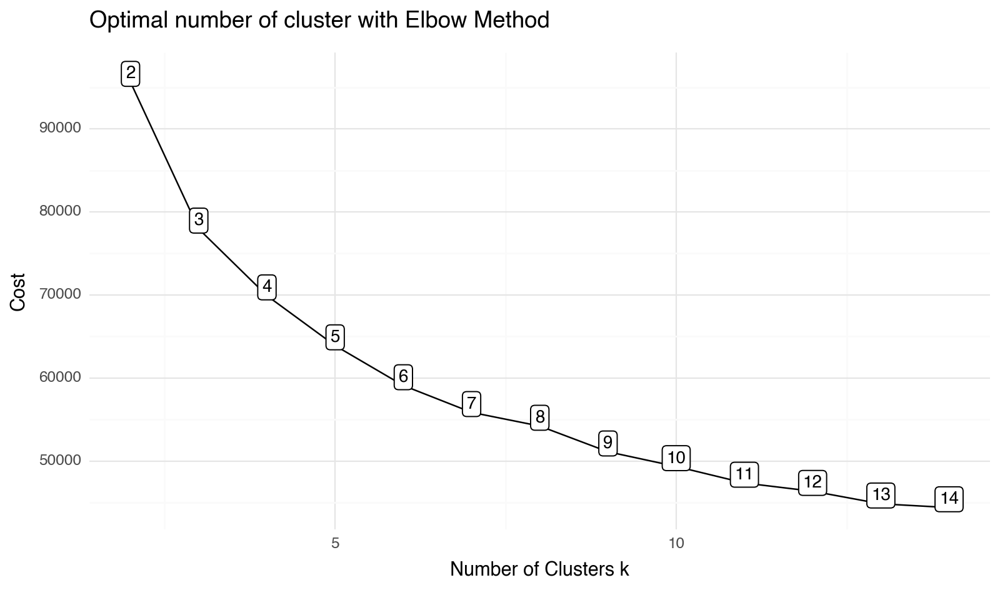

<Figure Size: (800 x 480)>

In [40]:
import plotnine
from plotnine import *
from kmodes.kprototypes import KPrototypes

cost = []
range_ = range(2, 15)
for cluster in range_:
 
        kprototype = KPrototypes(n_jobs = -1, n_clusters = cluster, init = 'Huang', random_state = 0)
        kprototype.fit_predict(df_train_kp_no_outliers, categorical = [0, 1, 2, 3, 4, 5])
        cost.append(kprototype.cost_)
        print('Cluster initiation: {}'.format(cluster))
 
# Converting the results into a dataframe and plotting them
df_cost = pd.DataFrame({'Cluster':range_, 'Cost':cost})
# Data viz
plotnine.options.figure_size = (8, 4.8)
(
    ggplot(data = df_cost)+
    geom_line(aes(x = 'Cluster',
                  y = 'Cost'))+
    geom_point(aes(x = 'Cluster',
                   y = 'Cost'))+
    geom_label(aes(x = 'Cluster',
                   y = 'Cost',
                   label = 'Cluster'),
               size = 10,
               nudge_y = 1000) +
    labs(title = 'Optimal number of cluster with Elbow Method')+
    xlab('Number of Clusters k')+
    ylab('Cost')+
    theme_minimal()
)

### best option is K=5

### Evaluation

As we have seen before we can apply several visualizations to obtain an intuitive idea of how good our model is. Unfortunately the PCA method and t-SNE do not admit categorical variables. But don’t worry, since the Prince library contains the MCA (Multiple correspondence analysis) method and it does **accept a mixed dataset.** 

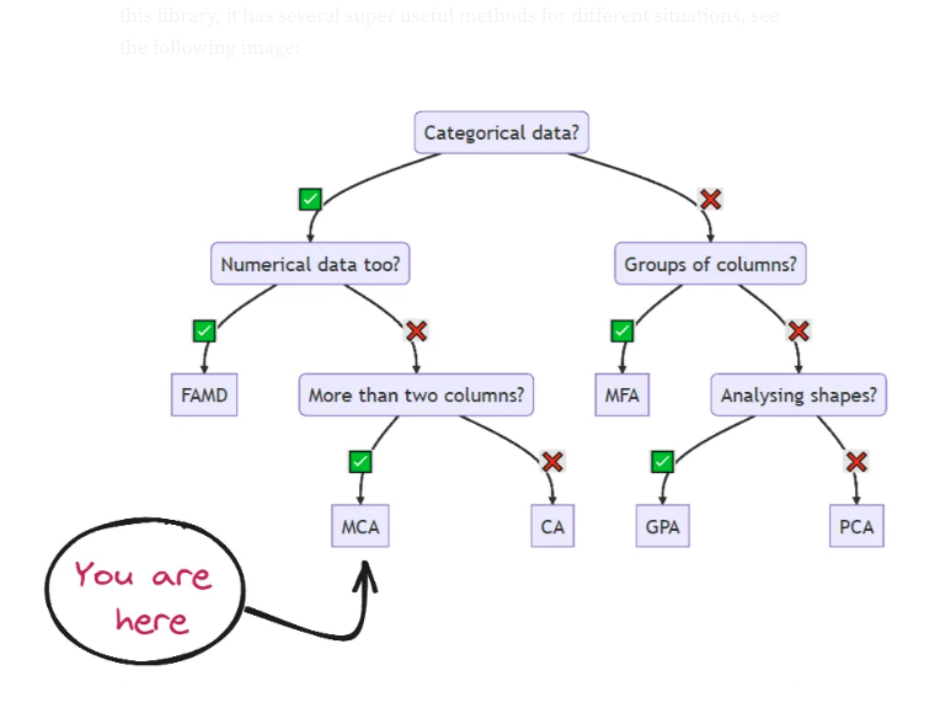

In [42]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
categorical_columns = df_train_kp_no_outliers.select_dtypes(exclude=numerics).columns
print(categorical_columns)
categorical_columns_index = [df_train_kp_no_outliers.columns.get_loc(col) for col in categorical_columns]

# Create the model
cluster_num = 5
kprototype = KPrototypes(n_jobs = -1, n_clusters = cluster_num, init = 'Huang', random_state = 0)
kprototype.fit(df_train_kp_no_outliers, categorical = categorical_columns_index)
clusters = kprototype.predict(df_train_kp_no_outliers , categorical = categorical_columns_index)

print(clusters)

Index(['job', 'marital', 'education', 'default', 'housing', 'loan'], dtype='object')
[3 0 0 ... 3 3 0]


In [43]:
def get_MCA_3d(df, predict):
    mca = prince.MCA(n_components =3, n_iter = 100, random_state = 101)
    mca_3d_df = mca.fit_transform(df)
    mca_3d_df.columns = ["comp1", "comp2", "comp3"]
    mca_3d_df["cluster"] = predict
    return mca, mca_3d_df

def get_MCA_2d(df, predict):
    mca = prince.MCA(n_components =2, n_iter = 100, random_state = 101)
    mca_2d_df = mca.fit_transform(df)
    mca_2d_df.columns = ["comp1", "comp2"]
    mca_2d_df["cluster"] = predict
    return mca, mca_2d_df
"-------------------------------------------------------------------"
mca_3d, mca_3d_df = get_MCA_3d(df_train_kp_no_outliers, clusters)

In [45]:
mca_3d_df

,comp1,comp2,comp3,cluster
0,0.662535,0.987567,-0.180520,3
1,0.103642,-0.333205,0.125617,0
2,-0.165308,-0.259992,-0.057749,0
3,-0.548013,0.209738,-0.804611,0
5,0.584402,0.186712,-0.425422,0
...,...,...,...,...
45202,0.177391,-0.402490,0.316896,2
45205,0.151542,-0.535868,0.551481,2
45206,0.346016,0.277968,-0.156025,3
45209,-0.520099,0.426750,0.042538,3


In [46]:
plot_pca_3d(mca_3d_df, title = "MCA Space", opacity=1, width_line = 0.1)

# Method 3: LLM + Kmeans

In [47]:
from sentence_transformers import SentenceTransformer

In [41]:
df_train

,age,job,marital,education,default,housing,loan,balance
0,58,management,married,tertiary,no,yes,no,2143
1,44,technician,single,secondary,no,yes,no,29
2,33,entrepreneur,married,secondary,no,yes,yes,2
3,47,blue-collar,married,unknown,no,yes,no,1506
4,33,unknown,single,unknown,no,no,no,1
...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,no,no,825
45207,71,retired,divorced,primary,no,no,no,1729
45208,72,retired,married,secondary,no,no,no,5715
45209,57,blue-collar,married,secondary,no,no,no,668


In [48]:
# -------------------- First Step --------------------
def compile_text(x):

    text =  f"""Age: {x['age']},  
                housing load: {x['housing']}, 
                Job: {x['job']}, 
                Marital: {x['marital']}, 
                Education: {x['education']}, 
                Default: {x['default']}, 
                Balance: {x['balance']}, 
                Personal loan: {x['loan']}
            """

    return text

sentences = df_train.apply(lambda x: compile_text(x), axis=1).tolist()

# -------------------- Second Step --------------------

model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2")
output = model.encode(
                    sentences=sentences,
                    show_progress_bar=True,
                    normalize_embeddings=True
                    )

df_embedding = pd.DataFrame(output)
df_embedding


/Users/1zuu/anaconda3/envs/llm/lib/python3.10/site-packages/bitsandbytes/cextension.py:34: UserWarning: The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.


'NoneType' object has no attribute 'cadam32bit_grad_fp32'


Batches:   0%|          | 0/1413 [00:00<?, ?it/s]

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,0.100417,0.025637,0.059398,0.037576,-0.049150,0.001145,-0.077372,-0.031073,-0.023566,0.003658,...,0.039300,-0.005895,0.057842,0.003483,-0.043649,-0.018242,0.148002,-0.039711,-0.019961,0.040698
1,0.096718,0.027161,0.062457,0.030532,-0.068783,-0.024620,-0.030748,-0.015792,-0.062324,-0.021347,...,0.030171,0.004436,0.046655,-0.004390,-0.058785,-0.025943,0.150738,-0.027368,-0.017910,0.040618
2,0.129104,0.024414,0.038848,0.013183,-0.050029,-0.010853,-0.048810,-0.026371,-0.050805,-0.002958,...,0.035086,-0.018932,0.056284,0.026366,-0.023457,-0.043787,0.147508,-0.037356,-0.016634,0.033980
3,0.071555,0.025719,0.058182,0.022939,-0.056037,0.020396,-0.057853,-0.025362,-0.038998,-0.003332,...,0.038886,-0.019637,0.040303,-0.000613,-0.036286,-0.037139,0.108552,-0.037604,-0.047005,0.024077
4,0.071991,0.045889,0.059294,0.045941,-0.035749,-0.024802,-0.026213,-0.035222,-0.058413,-0.025642,...,0.034485,0.005422,0.019619,0.019162,-0.037395,-0.017155,0.145237,-0.038857,-0.054124,0.045941
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.094606,0.041809,0.067775,0.030584,-0.063421,-0.010227,-0.051515,-0.015605,-0.038889,0.002010,...,0.030505,-0.003971,0.045625,-0.003108,-0.037601,-0.027375,0.140050,-0.042160,-0.012603,0.040642
45207,0.068075,0.047305,0.062273,0.052659,-0.048130,0.013675,-0.043034,-0.016806,-0.053405,-0.004559,...,0.038643,-0.021342,0.029171,0.003520,-0.044674,-0.049009,0.165002,-0.044777,-0.045716,0.055573
45208,0.072691,0.058640,0.069620,0.044029,-0.042700,0.001873,-0.063273,-0.024974,-0.046579,-0.002851,...,0.038674,-0.010257,0.035502,0.012217,-0.032661,-0.039250,0.141305,-0.035686,-0.051317,0.062620
45209,0.079211,0.028601,0.060208,0.027604,-0.055871,0.026986,-0.051449,-0.031026,-0.046522,0.005721,...,0.041762,-0.016296,0.039103,-0.006219,-0.025536,-0.037247,0.099956,-0.033059,-0.054432,0.051829


In [49]:
df_embedding.to_csv('store/cx_segmentaion/embedding.csv', index=False)

In [51]:
df_embedding = pd.read_csv('store/cx_segmentaion/embedding.csv')
df_embedding = df_embedding[df_train_kmeans['outlier'] == 0]
df_embedding

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,0.100417,0.025637,0.059398,0.037576,-0.049150,0.001145,-0.077372,-0.031073,-0.023566,0.003658,...,0.039300,-0.005895,0.057842,0.003483,-0.043649,-0.018242,0.148002,-0.039711,-0.019961,0.040698
1,0.096718,0.027161,0.062457,0.030532,-0.068783,-0.024620,-0.030748,-0.015792,-0.062324,-0.021347,...,0.030171,0.004436,0.046655,-0.004390,-0.058785,-0.025943,0.150738,-0.027368,-0.017910,0.040618
2,0.129104,0.024414,0.038848,0.013183,-0.050029,-0.010853,-0.048810,-0.026371,-0.050805,-0.002958,...,0.035086,-0.018932,0.056284,0.026366,-0.023457,-0.043787,0.147508,-0.037356,-0.016634,0.033980
3,0.071555,0.025719,0.058182,0.022939,-0.056037,0.020396,-0.057853,-0.025362,-0.038998,-0.003332,...,0.038886,-0.019637,0.040303,-0.000613,-0.036286,-0.037139,0.108552,-0.037604,-0.047005,0.024077
5,0.105711,0.029028,0.054330,0.034277,-0.047293,-0.005095,-0.066823,-0.025780,-0.042089,0.003322,...,0.040330,-0.003890,0.051029,0.002328,-0.036691,-0.018359,0.152053,-0.043776,-0.012175,0.037961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45202,0.068431,0.039286,0.062310,0.028082,-0.051944,-0.018307,-0.034389,-0.020926,-0.048929,-0.003047,...,0.052931,-0.006616,0.035765,0.014622,-0.042000,-0.030497,0.107273,-0.025734,-0.059895,0.060735
45205,0.072025,0.022744,0.049914,0.014841,-0.081187,-0.023930,-0.028337,-0.001867,-0.063026,-0.008280,...,0.039822,0.001976,0.046991,0.000022,-0.053003,-0.029256,0.141078,-0.024602,-0.016670,0.033080
45206,0.094606,0.041809,0.067775,0.030584,-0.063421,-0.010227,-0.051515,-0.015605,-0.038889,0.002010,...,0.030505,-0.003971,0.045625,-0.003108,-0.037601,-0.027375,0.140050,-0.042160,-0.012603,0.040642
45209,0.079211,0.028601,0.060208,0.027604,-0.055871,0.026986,-0.051449,-0.031026,-0.046522,0.005721,...,0.041762,-0.016296,0.039103,-0.006219,-0.025536,-0.037247,0.099956,-0.033059,-0.054432,0.051829


In [52]:
n_clusters = 5
clusters = KMeans(
                    n_clusters=n_clusters, 
                    init = "k-means++"
                    ).fit(df_embedding)
print(clusters.inertia_)
clusters_predict = clusters.predict(df_embedding)

/Users/1zuu/anaconda3/envs/llm/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


1258.899941070763


In [54]:
"""
The Davies Bouldin index is defined as the average similarity measure 
of each cluster with its most similar cluster, where similarity 
is the ratio of within-cluster distances to between-cluster distances.

The minimum value of the DB Index is 0, whereas a smaller 
value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(df_embedding,clusters_predict)}")
"""
Calinski Harabaz Index -> Variance Ratio Criterion.

Calinski Harabaz Index is defined as the ratio of the 
sum of between-cluster dispersion and of within-cluster dispersion.

The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(df_embedding,clusters_predict)}")

"""
The silhouette score is a metric used to calculate the goodness of 
fit of a clustering algorithm, but can also be used as 
a method for determining an optimal value of k (see here for more).

Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either
the data or the value of k is incorrect.

1 is the ideal value and indicates that clusters are very 
dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(df_embedding,clusters_predict)}")

Davies bouldin score: 1.7431186716478835
Calinski Score: 5743.910726042276
Silhouette Score: 0.19973492173589139


In [55]:
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0             59.722        15.55%                     15.55%
1             46.092        12.00%                     27.56%
2             34.695         9.04%                     36.59%
